# Not connet drive

In [ ]:
from IPython.display import clear_output
%mkdir "Yolov8s VisDrone"
%cd "Yolov8s VisDrone"
!sudo apt-get install rar
clear_output()

/content/Traffic Warning
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following NEW packages will be installed:
  rar
0 upgraded, 1 newly installed, 0 to remove and 6 not upgraded.
Need to get 341 kB of archives.
After this operation, 1,202 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/multiverse amd64 rar amd64 2:5.5.0-1.1 [341 kB]
Fetched 341 kB in 1s (244 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 78, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Selecting previously unselected package rar.
(Reading database ... 120872 files and dir

# Install

In [1]:
from IPython.display import clear_output
#install

!pip install -U Ultralytics
!pip install -U opencv-python
!pip install -U lapx

clear_output()

# Model

In [ ]:
import ultralytics
from ultralytics import  YOLO
import cv2

In [ ]:
from IPython.display import clear_output
model = YOLO('yolov8n.yaml')
model = YOLO('yolov8n.pt')

clear_output()

In [ ]:
from IPython.display import clear_output
model_seg = YOLO('yolov8n-seg.yaml')
model_seg = YOLO('yolov8n-seg.pt')
clear_output()

## Test Model

In [ ]:
# im2 = cv2.imread("test.jpg")
# results = model.predict(source=im2, save=True, save_txt=True)

In [ ]:
im2 = cv2.imread("test.jpg")
results = model.predict(source=im2)

In [ ]:
im2 = cv2.imread("test.jpg")
results = model_seg.predict(source=im2,save=True)

In [ ]:
im2 = cv2.imread("test.jpg")
results = model_seg.track(source=im2,save=True)

In [ ]:
print(results[1])

## Yolov8 model

### Test

In [ ]:
import ultralytics
from ultralytics import  YOLO
import cv2
from IPython.display import clear_output
import datetime
from collections import defaultdict
import numpy as np

In [ ]:

model_seg = YOLO('yolov8n-seg.pt')
clear_output()


In [ ]:
video_path = "test.mp4"

cap = cv2.VideoCapture(video_path)
if not cap.isOpened():
    print("Cannot open camera")
    exit()
while True:
    # Capture frame-by-frame
    ret, frame = cap.read()
    # if frame is read correctly ret is True
    if not ret:
        print("Can't receive frame (stream end?). Exiting ...")
        break
    # Our operations on the frame come here
    #gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    # Display the resulting frame
    width = 640
    height = 360
    dim = (width, height)

    # resize image
    frame = cv2.resize(frame, dim)
    results = model_seg(source=frame)
    cv2.imshow('video test', results[0].plot())
    if cv2.waitKey(1) == ord('q'):
        break
# When everything done, release the capture
cap.release()
cv2.destroyAllWindows()

In [ ]:

# Load the YOLOv8 model

# Open the video file
video_path = "test.mp4"
cap = cv2.VideoCapture(video_path)

# Loop through the video frames
while cap.isOpened():
    # Read a frame from the video
    success, frame = cap.read()

    if success:

        # Display the resulting frame
        width = 640
        height = 360
        dim = (width, height)

        frame = cv2.resize(frame, dim)


        # Run YOLOv8 tracking on the frame, persisting tracks between frames
        results = model_seg.track(frame, persist=True)

        # Visualize the results on the frame
        annotated_frame = results[0].plot()

        # Display the annotated frame
        cv2.imshow("YOLOv8 Tracking", annotated_frame)

        # Break the loop if 'q' is pressed
        if cv2.waitKey(1) & 0xFF == ord("q"):
            break
    else:
        # Break the loop if the end of the video is reached
        break

# Release the video capture object and close the display window
cap.release()
cv2.destroyAllWindows()

### Tracking

In [ ]:
import ultralytics
from ultralytics import  YOLO
import cv2
from IPython.display import clear_output
import datetime
from collections import defaultdict
import numpy as np

In [ ]:
model_seg = YOLO('yolov8n-seg.pt')
clear_output()

In [ ]:


# Open the video file
video_path = "test.mp4"
cap = cv2.VideoCapture(video_path)

# Store the track history
track_history = defaultdict(lambda: [])
# Initialize variables for tracking direction and speed
directions = defaultdict(lambda: [])
speeds = defaultdict(lambda: [])

# Loop through the video frames
while cap.isOpened():
    # start time to compute the fps
    start = datetime.datetime.now()

    # Read a frame from the video
    success, frame = cap.read()

    if success:

        # Display the resulting frame
        width = 640
        height = 360
        dim = (width, height)

        frame = cv2.resize(frame, dim)

        # Run YOLOv8 tracking on the frame, persisting tracks between frames
        results = model_seg.track(frame, persist=True,conf=0.4)


        # Visualize the results on the frame
        annotated_frame = results[0].plot()

        try:
            # Get the boxes and track IDs
            boxes = results[0].boxes.xywh
            track_ids = results[0].boxes.id.int().tolist()

            # Plot the tracks
            for box, track_id in zip(boxes, track_ids):
                x, y, w, h = box
                track = track_history[track_id]
                track.append((float(x), float(y)))  # x, y center point

                if len(track) > 2:
                    # Calculate displacement vector
                    dx = track[-1][0] - track[-2][0]
                    dy = track[-1][1] - track[-2][1]

                    # Calculate direction
                    direction = np.arctan2(dy, dx)
                    directions[track_id].append(direction)

                    # Calculate speed
                    speed = np.linalg.norm((dx, dy)) / 0.04 # Assuming frame rate of 25 fps
                    speeds[track_id].append(speed)

                if len(track) > 30:  # retain 90 tracks for 90 frames
                    track.pop(0)

                # Draw the tracking lines
                points = np.hstack(track).astype(np.int32).reshape((-1, 1, 2))
                cv2.polylines(annotated_frame, [points], isClosed=True, color=(0, 255, 0), thickness=1)

                # Get direction and speed
                direction = directions[track_id][-1]
                speed = speeds[track_id][-1]

                # Calculate coordinates of direction vector
                x_v = int(x + speed * np.cos(direction))
                y_v = int(y + speed * np.sin(direction))

                # Draw the direction vector
                cv2.arrowedLine(annotated_frame, ((int(x)), (int(y))), (x_v, y_v), color=(0, 0, 255), thickness=1)

        except:
            pass

        # end time to compute the fps
        end = datetime.datetime.now()
        # show the time it took to process 1 frame
        print(f"Time to process 1 frame: {(end - start).total_seconds() * 1000:.0f} milliseconds")
        # calculate the frame per second and draw it on the frame
        fps = f"FPS: {1 / (end - start).total_seconds():.2f}"
        cv2.putText(annotated_frame, fps, (10, 30),
                    cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)
            # Display the annotated frame
        cv2.imshow("YOLOv8 Tracking", annotated_frame)

        # Break the loop if 'q' is pressed
        if cv2.waitKey(1) & 0xFF == ord("q"):
            break
    else:
        # Break the loop if the end of the video is reached
        break

# Release the video capture object and close the display window
cap.release()
cv2.destroyAllWindows()



0: 384x640 2 cars, 165.1ms
Speed: 234.0ms preprocess, 165.1ms inference, 10.5ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 880 milliseconds


0: 384x640 1 car, 64.9ms
Speed: 4.5ms preprocess, 64.9ms inference, 14.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 car, 64.8ms
Speed: 4.5ms preprocess, 64.8ms inference, 8.5ms postprocess per image at shape (1, 3, 384, 640)


Time to process 1 frame: 200 milliseconds



0: 384x640 1 car, 64.8ms
Speed: 4.5ms preprocess, 64.8ms inference, 10.6ms postprocess per image at shape (1, 3, 384, 640)


Time to process 1 frame: 190 milliseconds
Time to process 1 frame: 183 milliseconds



0: 384x640 1 car, 63.8ms
Speed: 4.0ms preprocess, 63.8ms inference, 12.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 car, 63.2ms
Speed: 3.0ms preprocess, 63.2ms inference, 7.4ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 181 milliseconds
Time to process 1 frame: 166 milliseconds


0: 384x640 1 car, 61.8ms
Speed: 4.0ms preprocess, 61.8ms inference, 8.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 car, 62.8ms
Speed: 4.1ms preprocess, 62.8ms inference, 10.6ms postprocess per image at shape (1, 3, 384, 640)


Time to process 1 frame: 163 milliseconds
Time to process 1 frame: 176 milliseconds



0: 384x640 1 car, 64.3ms
Speed: 4.0ms preprocess, 64.3ms inference, 9.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 car, 118.2ms


Time to process 1 frame: 206 milliseconds


Speed: 2.5ms preprocess, 118.2ms inference, 4.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 car, 114.2ms


Time to process 1 frame: 229 milliseconds


Speed: 2.0ms preprocess, 114.2ms inference, 7.0ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 185 milliseconds


0: 384x640 1 car, 110.1ms
Speed: 3.0ms preprocess, 110.1ms inference, 4.5ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 220 milliseconds


0: 384x640 1 car, 107.3ms
Speed: 3.0ms preprocess, 107.3ms inference, 20.4ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 182 milliseconds


0: 384x640 1 car, 92.0ms
Speed: 2.0ms preprocess, 92.0ms inference, 14.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 car, 96.9ms
Speed: 2.0ms preprocess, 96.9ms inference, 14.2ms postprocess per image at shape (1, 3, 384, 640)


Time to process 1 frame: 213 milliseconds
Time to process 1 frame: 190 milliseconds



0: 384x640 1 car, 116.0ms
Speed: 3.5ms preprocess, 116.0ms inference, 37.5ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 228 milliseconds


0: 384x640 1 car, 115.4ms
Speed: 3.0ms preprocess, 115.4ms inference, 5.1ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 200 milliseconds


0: 384x640 1 car, 101.8ms
Speed: 3.0ms preprocess, 101.8ms inference, 5.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 car, 99.2ms


Time to process 1 frame: 261 milliseconds


Speed: 3.0ms preprocess, 99.2ms inference, 10.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 car, 63.3ms
Speed: 3.0ms preprocess, 63.3ms inference, 8.5ms postprocess per image at shape (1, 3, 384, 640)


Time to process 1 frame: 195 milliseconds
Time to process 1 frame: 160 milliseconds



0: 384x640 1 car, 63.3ms
Speed: 4.6ms preprocess, 63.3ms inference, 8.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 car, 62.2ms
Speed: 3.0ms preprocess, 62.2ms inference, 9.5ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 163 milliseconds
Time to process 1 frame: 167 milliseconds


0: 384x640 1 car, 62.8ms
Speed: 4.0ms preprocess, 62.8ms inference, 10.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 car, 61.8ms
Speed: 4.0ms preprocess, 61.8ms inference, 10.5ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 169 milliseconds
Time to process 1 frame: 164 milliseconds


0: 384x640 1 car, 61.9ms
Speed: 4.0ms preprocess, 61.9ms inference, 10.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 car, 62.8ms
Speed: 4.6ms preprocess, 62.8ms inference, 7.5ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 170 milliseconds
Time to process 1 frame: 157 milliseconds


0: 384x640 1 car, 62.8ms
Speed: 4.0ms preprocess, 62.8ms inference, 7.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 car, 61.7ms
Speed: 4.5ms preprocess, 61.7ms inference, 7.5ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 161 milliseconds
Time to process 1 frame: 159 milliseconds


0: 384x640 1 car, 62.8ms
Speed: 3.5ms preprocess, 62.8ms inference, 9.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 car, 62.2ms
Speed: 3.0ms preprocess, 62.2ms inference, 8.4ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 163 milliseconds
Time to process 1 frame: 147 milliseconds


0: 384x640 1 car, 62.4ms
Speed: 4.5ms preprocess, 62.4ms inference, 8.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 car, 62.8ms
Speed: 3.5ms preprocess, 62.8ms inference, 8.5ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 167 milliseconds
Time to process 1 frame: 154 milliseconds


0: 384x640 1 car, 62.0ms
Speed: 3.5ms preprocess, 62.0ms inference, 8.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 car, 61.3ms
Speed: 4.0ms preprocess, 61.3ms inference, 9.0ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 164 milliseconds
Time to process 1 frame: 161 milliseconds


0: 384x640 1 car, 62.7ms
Speed: 3.0ms preprocess, 62.7ms inference, 10.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 car, 62.3ms
Speed: 4.0ms preprocess, 62.3ms inference, 7.5ms postprocess per image at shape (1, 3, 384, 640)


Time to process 1 frame: 159 milliseconds
Time to process 1 frame: 152 milliseconds



0: 384x640 1 car, 61.8ms
Speed: 3.0ms preprocess, 61.8ms inference, 8.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 car, 62.3ms
Speed: 4.0ms preprocess, 62.3ms inference, 7.5ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 158 milliseconds
Time to process 1 frame: 162 milliseconds


0: 384x640 1 car, 62.8ms
Speed: 4.5ms preprocess, 62.8ms inference, 9.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 car, 63.3ms
Speed: 4.0ms preprocess, 63.3ms inference, 7.9ms postprocess per image at shape (1, 3, 384, 640)


Time to process 1 frame: 151 milliseconds
Time to process 1 frame: 171 milliseconds



0: 384x640 1 car, 61.3ms
Speed: 4.0ms preprocess, 61.3ms inference, 7.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 car, 61.3ms
Speed: 4.0ms preprocess, 61.3ms inference, 7.5ms postprocess per image at shape (1, 3, 384, 640)


Time to process 1 frame: 166 milliseconds
Time to process 1 frame: 166 milliseconds



0: 384x640 1 car, 61.7ms
Speed: 4.0ms preprocess, 61.7ms inference, 10.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 car, 64.4ms
Speed: 3.0ms preprocess, 64.4ms inference, 16.4ms postprocess per image at shape (1, 3, 384, 640)


Time to process 1 frame: 152 milliseconds
Time to process 1 frame: 179 milliseconds



0: 384x640 1 car, 63.3ms
Speed: 3.5ms preprocess, 63.3ms inference, 9.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 car, 63.9ms
Speed: 3.0ms preprocess, 63.9ms inference, 11.1ms postprocess per image at shape (1, 3, 384, 640)


Time to process 1 frame: 165 milliseconds
Time to process 1 frame: 164 milliseconds



0: 384x640 1 car, 62.4ms
Speed: 4.0ms preprocess, 62.4ms inference, 8.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 car, 62.2ms
Speed: 3.5ms preprocess, 62.2ms inference, 8.1ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 150 milliseconds
Time to process 1 frame: 160 milliseconds


0: 384x640 1 car, 62.6ms
Speed: 4.5ms preprocess, 62.6ms inference, 7.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 car, 61.2ms
Speed: 4.0ms preprocess, 61.2ms inference, 10.0ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 154 milliseconds
Time to process 1 frame: 156 milliseconds


0: 384x640 (no detections), 62.5ms
Speed: 4.0ms preprocess, 62.5ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 motorcycle, 62.3ms
Speed: 3.5ms preprocess, 62.3ms inference, 9.6ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 103 milliseconds
Time to process 1 frame: 167 milliseconds


0: 384x640 (no detections), 61.8ms
Speed: 4.5ms preprocess, 61.8ms inference, 4.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 62.4ms
Speed: 3.5ms preprocess, 62.4ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 61.8ms


Time to process 1 frame: 107 milliseconds
Time to process 1 frame: 103 milliseconds


Speed: 3.5ms preprocess, 61.8ms inference, 3.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 62.4ms
Speed: 3.0ms preprocess, 62.4ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 62.2ms


Time to process 1 frame: 100 milliseconds
Time to process 1 frame: 98 milliseconds


Speed: 3.0ms preprocess, 62.2ms inference, 3.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 61.3ms
Speed: 4.5ms preprocess, 61.3ms inference, 3.0ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 97 milliseconds
Time to process 1 frame: 101 milliseconds


0: 384x640 (no detections), 62.0ms
Speed: 3.0ms preprocess, 62.0ms inference, 4.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 61.5ms
Speed: 4.0ms preprocess, 61.5ms inference, 3.5ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 99 milliseconds
Time to process 1 frame: 104 milliseconds


0: 384x640 (no detections), 62.2ms
Speed: 3.5ms preprocess, 62.2ms inference, 3.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 61.7ms
Speed: 4.6ms preprocess, 61.7ms inference, 3.0ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 100 milliseconds
Time to process 1 frame: 101 milliseconds


0: 384x640 1 truck, 61.8ms
Speed: 3.6ms preprocess, 61.8ms inference, 10.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 truck, 61.8ms
Speed: 4.0ms preprocess, 61.8ms inference, 10.5ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 168 milliseconds
Time to process 1 frame: 159 milliseconds


0: 384x640 1 truck, 62.8ms
Speed: 4.0ms preprocess, 62.8ms inference, 8.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 truck, 62.8ms
Speed: 5.5ms preprocess, 62.8ms inference, 8.6ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 155 milliseconds
Time to process 1 frame: 150 milliseconds


0: 384x640 1 car, 62.2ms
Speed: 5.5ms preprocess, 62.2ms inference, 9.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 car, 1 truck, 61.7ms
Speed: 4.0ms preprocess, 61.7ms inference, 8.5ms postprocess per image at shape (1, 3, 384, 640)


Time to process 1 frame: 158 milliseconds
Time to process 1 frame: 159 milliseconds



0: 384x640 1 car, 1 truck, 62.3ms
Speed: 3.0ms preprocess, 62.3ms inference, 9.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 car, 61.7ms
Speed: 4.0ms preprocess, 61.7ms inference, 8.6ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 158 milliseconds
Time to process 1 frame: 146 milliseconds


0: 384x640 (no detections), 62.0ms
Speed: 3.5ms preprocess, 62.0ms inference, 3.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 car, 62.8ms
Speed: 4.0ms preprocess, 62.8ms inference, 8.5ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 102 milliseconds
Time to process 1 frame: 164 milliseconds


0: 384x640 1 car, 62.8ms
Speed: 3.0ms preprocess, 62.8ms inference, 9.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 car, 61.7ms
Speed: 4.0ms preprocess, 61.7ms inference, 8.5ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 157 milliseconds
Time to process 1 frame: 156 milliseconds


0: 384x640 1 car, 62.3ms
Speed: 4.5ms preprocess, 62.3ms inference, 10.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 car, 62.3ms
Speed: 4.0ms preprocess, 62.3ms inference, 11.2ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 165 milliseconds
Time to process 1 frame: 155 milliseconds


0: 384x640 1 car, 61.4ms
Speed: 5.0ms preprocess, 61.4ms inference, 7.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 61.8ms
Speed: 4.0ms preprocess, 61.8ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 161 milliseconds
Time to process 1 frame: 102 milliseconds


0: 384x640 1 person, 63.2ms
Speed: 3.5ms preprocess, 63.2ms inference, 7.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 62.7ms
Speed: 3.0ms preprocess, 62.7ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 150 milliseconds
Time to process 1 frame: 101 milliseconds


0: 384x640 (no detections), 61.8ms
Speed: 4.0ms preprocess, 61.8ms inference, 3.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 car, 61.8ms
Speed: 3.0ms preprocess, 61.8ms inference, 14.1ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 102 milliseconds
Time to process 1 frame: 169 milliseconds


0: 384x640 (no detections), 62.3ms
Speed: 4.0ms preprocess, 62.3ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 car, 61.7ms
Speed: 4.5ms preprocess, 61.7ms inference, 6.5ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 102 milliseconds
Time to process 1 frame: 145 milliseconds


0: 384x640 1 car, 62.3ms
Speed: 4.6ms preprocess, 62.3ms inference, 7.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 car, 61.8ms
Speed: 4.0ms preprocess, 61.8ms inference, 8.5ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 158 milliseconds
Time to process 1 frame: 153 milliseconds


0: 384x640 1 car, 61.8ms
Speed: 5.0ms preprocess, 61.8ms inference, 7.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 car, 1 train, 61.8ms
Speed: 4.5ms preprocess, 61.8ms inference, 8.5ms postprocess per image at shape (1, 3, 384, 640)


Time to process 1 frame: 147 milliseconds
Time to process 1 frame: 161 milliseconds



0: 384x640 1 person, 62.8ms
Speed: 4.0ms preprocess, 62.8ms inference, 7.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 1 car, 62.2ms
Speed: 4.0ms preprocess, 62.2ms inference, 8.8ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 159 milliseconds
Time to process 1 frame: 158 milliseconds


0: 384x640 1 person, 1 car, 63.3ms
Speed: 4.0ms preprocess, 63.3ms inference, 13.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 1 car, 61.8ms
Speed: 3.5ms preprocess, 61.8ms inference, 9.5ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 171 milliseconds
Time to process 1 frame: 163 milliseconds


0: 384x640 1 car, 62.3ms
Speed: 3.5ms preprocess, 62.3ms inference, 6.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 car, 61.7ms
Speed: 4.5ms preprocess, 61.7ms inference, 8.5ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 148 milliseconds
Time to process 1 frame: 161 milliseconds


0: 384x640 1 car, 61.8ms
Speed: 3.5ms preprocess, 61.8ms inference, 11.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 1 car, 62.3ms
Speed: 4.0ms preprocess, 62.3ms inference, 7.0ms postprocess per image at shape (1, 3, 384, 640)


Time to process 1 frame: 160 milliseconds
Time to process 1 frame: 164 milliseconds



0: 384x640 1 car, 62.3ms
Speed: 4.0ms preprocess, 62.3ms inference, 6.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 car, 62.2ms
Speed: 3.0ms preprocess, 62.2ms inference, 7.5ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 144 milliseconds
Time to process 1 frame: 149 milliseconds


0: 384x640 1 person, 1 car, 61.8ms
Speed: 3.5ms preprocess, 61.8ms inference, 9.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 62.6ms
Speed: 2.5ms preprocess, 62.6ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 152 milliseconds
Time to process 1 frame: 100 milliseconds


0: 384x640 1 person, 1 car, 61.7ms
Speed: 4.0ms preprocess, 61.7ms inference, 10.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 62.8ms
Speed: 3.5ms preprocess, 62.8ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 161 milliseconds
Time to process 1 frame: 102 milliseconds


0: 384x640 (no detections), 62.8ms
Speed: 4.0ms preprocess, 62.8ms inference, 3.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 61.9ms
Speed: 2.5ms preprocess, 61.9ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 61.4ms


Time to process 1 frame: 106 milliseconds
Time to process 1 frame: 97 milliseconds


Speed: 3.0ms preprocess, 61.4ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 61.6ms
Speed: 3.6ms preprocess, 61.6ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 95 milliseconds
Time to process 1 frame: 98 milliseconds


0: 384x640 (no detections), 62.2ms
Speed: 2.0ms preprocess, 62.2ms inference, 3.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 persons, 62.2ms
Speed: 3.5ms preprocess, 62.2ms inference, 7.1ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 99 milliseconds
Time to process 1 frame: 147 milliseconds


0: 384x640 1 person, 62.1ms
Speed: 4.0ms preprocess, 62.1ms inference, 8.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 61.3ms
Speed: 4.5ms preprocess, 61.3ms inference, 3.5ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 148 milliseconds
Time to process 1 frame: 105 milliseconds


0: 384x640 (no detections), 61.8ms
Speed: 3.5ms preprocess, 61.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 61.7ms
Speed: 3.0ms preprocess, 61.7ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 103 milliseconds
Time to process 1 frame: 102 milliseconds


0: 384x640 (no detections), 61.8ms
Speed: 4.5ms preprocess, 61.8ms inference, 4.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 61.3ms
Speed: 3.0ms preprocess, 61.3ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 102 milliseconds
Time to process 1 frame: 93 milliseconds


0: 384x640 1 person, 61.8ms
Speed: 5.5ms preprocess, 61.8ms inference, 9.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 61.9ms
Speed: 4.5ms preprocess, 61.9ms inference, 8.1ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 155 milliseconds
Time to process 1 frame: 162 milliseconds


0: 384x640 1 person, 61.8ms
Speed: 3.5ms preprocess, 61.8ms inference, 8.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 62.1ms
Speed: 4.5ms preprocess, 62.1ms inference, 7.0ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 154 milliseconds
Time to process 1 frame: 150 milliseconds


0: 384x640 (no detections), 62.3ms
Speed: 3.5ms preprocess, 62.3ms inference, 3.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 62.8ms
Speed: 3.0ms preprocess, 62.8ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 61.5ms


Time to process 1 frame: 102 milliseconds
Time to process 1 frame: 100 milliseconds


Speed: 2.5ms preprocess, 61.5ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 62.2ms
Speed: 2.6ms preprocess, 62.2ms inference, 3.0ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 101 milliseconds
Time to process 1 frame: 102 milliseconds


0: 384x640 (no detections), 62.3ms
Speed: 4.0ms preprocess, 62.3ms inference, 3.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 61.9ms
Speed: 5.0ms preprocess, 61.9ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 61.8ms


Time to process 1 frame: 104 milliseconds
Time to process 1 frame: 99 milliseconds


Speed: 3.0ms preprocess, 61.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 61.6ms
Speed: 3.0ms preprocess, 61.6ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 95 milliseconds
Time to process 1 frame: 99 milliseconds


0: 384x640 (no detections), 62.3ms
Speed: 3.0ms preprocess, 62.3ms inference, 3.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 61.5ms
Speed: 3.0ms preprocess, 61.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 61.2ms


Time to process 1 frame: 98 milliseconds
Time to process 1 frame: 94 milliseconds


Speed: 2.0ms preprocess, 61.2ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 motorcycle, 61.7ms
Speed: 3.0ms preprocess, 61.7ms inference, 5.5ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 98 milliseconds
Time to process 1 frame: 145 milliseconds


0: 384x640 1 person, 62.4ms
Speed: 4.0ms preprocess, 62.4ms inference, 8.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 1 motorcycle, 64.1ms
Speed: 3.0ms preprocess, 64.1ms inference, 9.5ms postprocess per image at shape (1, 3, 384, 640)


Time to process 1 frame: 159 milliseconds



0: 384x640 1 person, 61.8ms
Speed: 4.0ms preprocess, 61.8ms inference, 8.6ms postprocess per image at shape (1, 3, 384, 640)


Time to process 1 frame: 176 milliseconds
Time to process 1 frame: 170 milliseconds



0: 384x640 1 person, 62.3ms
Speed: 4.6ms preprocess, 62.3ms inference, 10.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 61.3ms
Speed: 3.0ms preprocess, 61.3ms inference, 9.5ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 172 milliseconds
Time to process 1 frame: 153 milliseconds


0: 384x640 1 person, 62.3ms
Speed: 4.0ms preprocess, 62.3ms inference, 8.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 1 motorcycle, 62.2ms
Speed: 4.5ms preprocess, 62.2ms inference, 6.0ms postprocess per image at shape (1, 3, 384, 640)


Time to process 1 frame: 167 milliseconds
Time to process 1 frame: 162 milliseconds



0: 384x640 1 person, 1 motorcycle, 61.8ms
Speed: 3.5ms preprocess, 61.8ms inference, 10.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 1 motorcycle, 61.3ms
Speed: 2.5ms preprocess, 61.3ms inference, 6.5ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 167 milliseconds
Time to process 1 frame: 159 milliseconds


0: 384x640 1 person, 1 motorcycle, 61.3ms
Speed: 4.0ms preprocess, 61.3ms inference, 9.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 62.3ms
Speed: 4.0ms preprocess, 62.3ms inference, 7.0ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 161 milliseconds
Time to process 1 frame: 154 milliseconds


0: 384x640 (no detections), 63.4ms
Speed: 3.0ms preprocess, 63.4ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 61.8ms
Speed: 3.5ms preprocess, 61.8ms inference, 9.5ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 104 milliseconds
Time to process 1 frame: 165 milliseconds


0: 384x640 (no detections), 62.3ms
Speed: 4.5ms preprocess, 62.3ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 62.8ms
Speed: 4.0ms preprocess, 62.8ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 104 milliseconds
Time to process 1 frame: 105 milliseconds


0: 384x640 (no detections), 61.5ms
Speed: 4.0ms preprocess, 61.5ms inference, 4.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 62.2ms
Speed: 3.0ms preprocess, 62.2ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 62.2ms


Time to process 1 frame: 105 milliseconds
Time to process 1 frame: 98 milliseconds


Speed: 3.0ms preprocess, 62.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 62.1ms
Speed: 3.5ms preprocess, 62.1ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 62.2ms


Time to process 1 frame: 95 milliseconds
Time to process 1 frame: 101 milliseconds


Speed: 4.6ms preprocess, 62.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 61.8ms
Speed: 3.0ms preprocess, 61.8ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 97 milliseconds
Time to process 1 frame: 99 milliseconds


0: 384x640 (no detections), 61.6ms
Speed: 3.0ms preprocess, 61.6ms inference, 3.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 61.8ms
Speed: 4.0ms preprocess, 61.8ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 102 milliseconds
Time to process 1 frame: 101 milliseconds


0: 384x640 (no detections), 62.3ms
Speed: 3.5ms preprocess, 62.3ms inference, 3.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 62.8ms
Speed: 3.0ms preprocess, 62.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 62.0ms


Time to process 1 frame: 103 milliseconds
Time to process 1 frame: 103 milliseconds


Speed: 3.0ms preprocess, 62.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 62.1ms
Speed: 3.0ms preprocess, 62.1ms inference, 3.0ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 96 milliseconds
Time to process 1 frame: 101 milliseconds


0: 384x640 (no detections), 61.8ms
Speed: 3.0ms preprocess, 61.8ms inference, 3.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 62.4ms
Speed: 3.0ms preprocess, 62.4ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 98 milliseconds
Time to process 1 frame: 96 milliseconds


0: 384x640 (no detections), 62.5ms
Speed: 3.0ms preprocess, 62.5ms inference, 3.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 61.0ms
Speed: 3.0ms preprocess, 61.0ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 62.6ms


Time to process 1 frame: 100 milliseconds
Time to process 1 frame: 100 milliseconds


Speed: 2.0ms preprocess, 62.6ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 62.8ms
Speed: 2.0ms preprocess, 62.8ms inference, 4.0ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 95 milliseconds
Time to process 1 frame: 104 milliseconds


0: 384x640 (no detections), 61.3ms
Speed: 4.0ms preprocess, 61.3ms inference, 3.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 62.4ms
Speed: 4.5ms preprocess, 62.4ms inference, 3.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 62.8ms


Time to process 1 frame: 104 milliseconds
Time to process 1 frame: 104 milliseconds


Speed: 2.0ms preprocess, 62.8ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 63.6ms
Speed: 2.0ms preprocess, 63.6ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 104 milliseconds
Time to process 1 frame: 103 milliseconds


0: 384x640 (no detections), 63.2ms
Speed: 2.0ms preprocess, 63.2ms inference, 3.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 62.5ms
Speed: 4.0ms preprocess, 62.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 99 milliseconds
Time to process 1 frame: 101 milliseconds


0: 384x640 (no detections), 63.0ms
Speed: 2.0ms preprocess, 63.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 62.5ms
Speed: 2.5ms preprocess, 62.5ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 97 milliseconds
Time to process 1 frame: 102 milliseconds


0: 384x640 (no detections), 62.1ms
Speed: 2.0ms preprocess, 62.1ms inference, 4.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 63.0ms
Speed: 4.0ms preprocess, 63.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 97 milliseconds
Time to process 1 frame: 102 milliseconds


0: 384x640 (no detections), 62.8ms
Speed: 3.0ms preprocess, 62.8ms inference, 3.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 61.8ms
Speed: 4.0ms preprocess, 61.8ms inference, 6.5ms postprocess per image at shape (1, 3, 384, 640)



Time to process 1 frame: 102 milliseconds
Time to process 1 frame: 151 milliseconds


0: 384x640 1 person, 62.6ms
Speed: 4.6ms preprocess, 62.6ms inference, 9.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 61.9ms
Speed: 5.5ms preprocess, 61.9ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)


Time to process 1 frame: 169 milliseconds
Time to process 1 frame: 104 milliseconds


# Custom Model

## Training

### Bad Resul

#### Not connect drive

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('yolov8s.pt')  # load a pretrained model (recommended for training)

# Train the model
results = model.train(data='VisDrone.yaml', epochs=10,batch= 24,lr0=0.1,optimizer="Adam", imgsz=640)


100%|██████████| 21.5M/21.5M [00:00<00:00, 262MB/s]
Ultralytics YOLOv8.0.209 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=VisDrone.yaml, epochs=10, patience=50, batch=24, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('/content/drive/MyDrive/Colab Notebooks/Yolov8s VisDrone/best.pt')  # load a pretrained model (recommended for training)

# Train the model
results = model.train(data='VisDrone.yaml', epochs=10,batch= 24,lr0=0.1,verbose=True,optimizer="Adam", imgsz=640)

Ultralytics YOLOv8.0.209 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/drive/MyDrive/Colab Notebooks/Traffic Warning/best.pt, data=VisDrone.yaml, epochs=10, patience=50, batch=24, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=Tru

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [ ]:
!cp "/content/Yolov8s VisDrone/runs/detect/train2/weights/best.pt" "/content/drive/MyDrive/Colab Notebooks/Yolov8s VisDrone/"

In [ ]:
!cp "/content/Yolov8s VisDrone/runs/detect/train2/weights/last.pt" "/content/drive/MyDrive/Colab Notebooks/Yolov8s VisDrone/"

#### Connect drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd "/content/drive/MyDrive/Colab Notebooks/Yolov8s VisDrone"

/content/drive/.shortcut-targets-by-id/1tiBC4N1D1C498rbABPQykfd5C6v__ORb/Colab Notebooks/Traffic Warning


In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('best.pt')  # load a pretrained model (recommended for training)

# Train the model
results = model.train(data='VisDrone.yaml', epochs=50,batch= 24,lr0=0.1,verbose=True,optimizer="Adam", imgsz=640)

Ultralytics YOLOv8.0.209 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=best.pt, data=VisDrone.yaml, epochs=50, patience=50, batch=24, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False, int8

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('runs/detect/train/weights/last.pt')  # load a partially trained model

# Resume training
results = model.train(resume=True)


Ultralytics YOLOv8.0.209 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=runs/detect/train/weights/last.pt, data=/usr/local/lib/python3.10/dist-packages/ultralytics/cfg/datasets/VisDrone.yaml, epochs=50, patience=50, batch=24, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('runs/detect/train/weights/last.pt')  # load a partially trained model

# Resume training
results = model.train(resume=True)

Ultralytics YOLOv8.0.209 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=runs/detect/train/weights/last.pt, data=/usr/local/lib/python3.10/dist-packages/ultralytics/cfg/datasets/VisDrone.yaml, epochs=50, patience=50, batch=24, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('runs/detect/train/weights/best.pt')  # load a pretrained model (recommended for training)

# Train the model
results = model.train(data='VisDrone.yaml', epochs=100,batch= 24,verbose=True,optimizer="Adam", imgsz=640)

Ultralytics YOLOv8.0.209 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=runs/detect/train/weights/best.pt, data=VisDrone.yaml, epochs=100, patience=50, batch=24, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('runs/detect/train2/weights/last.pt')  # load a partially trained model

# Resume training
results = model.train(resume=True)


Ultralytics YOLOv8.0.209 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=runs/detect/train2/weights/last.pt, data=/usr/local/lib/python3.10/dist-packages/ultralytics/cfg/datasets/VisDrone.yaml, epochs=100, patience=50, batch=24, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, class

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('runs/detect/train2/weights/last.pt')  # load a partially trained model

# Resume training
results = model.train(resume=True)


Ultralytics YOLOv8.0.209 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=runs/detect/train2/weights/last.pt, data=/usr/local/lib/python3.10/dist-packages/ultralytics/cfg/datasets/VisDrone.yaml, epochs=100, patience=50, batch=24, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, class

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('runs/detect/train2/weights/last.pt')  # load a partially trained model

# Resume training
results = model.train(resume=True)

Ultralytics YOLOv8.0.209 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=runs/detect/train2/weights/last.pt, data=/usr/local/lib/python3.10/dist-packages/ultralytics/cfg/datasets/VisDrone.yaml, epochs=100, patience=50, batch=24, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, class

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-4-2cb27c04a809>", line 7, in <cell line: 7>
    results = model.train(resume=True)
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/engine/model.py", line 338, in train
    self.trainer.train()
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/engine/trainer.py", line 190, in train
    self._do_train(world_size)
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/engine/trainer.py", line 320, in _do_train
    for i, batch in pbar:
  File "/usr/local/lib/python3.10/dist-packages/tqdm/std.py", line 1182, in __iter__
    for obj in iterable:
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/data/build.py", line 42, in __iter__
    yield next(self.iterator)
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", 

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('runs/detect/train2/weights/last.pt')  # load a partially trained model

# Resume training
results = model.train(resume=True)

Ultralytics YOLOv8.0.209 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=runs/detect/train2/weights/last.pt, data=/usr/local/lib/python3.10/dist-packages/ultralytics/cfg/datasets/VisDrone.yaml, epochs=100, patience=50, batch=24, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, class

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('runs/detect/train2/weights/best.pt')  # load a pretrained model (recommended for training)

# Train the model
results = model.train(data='VisDrone.yaml', epochs=100,batch= 24, imgsz=640)

Ultralytics YOLOv8.0.209 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=runs/detect/train2/weights/best.pt, data=VisDrone.yaml, epochs=100, patience=50, batch=24, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, kera

## Good result

#### Connect drive

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
%cd "/content/drive/MyDrive/Colab Notebooks/Yolov8s VisDrone"

/content/drive/.shortcut-targets-by-id/1tiBC4N1D1C498rbABPQykfd5C6v__ORb/Colab Notebooks/Yolov8s VisDrone


#### Training

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('yolov8s.pt')  # load a pretrained model (recommended for training)

# Train the model
results = model.train(data='VisDrone.yaml', epochs=300,batch= 24, imgsz=640)

100%|██████████| 21.5M/21.5M [00:00<00:00, 139MB/s]
Ultralytics YOLOv8.0.209 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=VisDrone.yaml, epochs=300, patience=50, batch=24, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=Tr

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('runs/detect/train4/weights/last.pt')  # load a partially trained model

# Resume training
results = model.train(resume=True)

Ultralytics YOLOv8.0.210 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=runs/detect/train4/weights/last.pt, data=/usr/local/lib/python3.10/dist-packages/ultralytics/cfg/datasets/VisDrone.yaml, epochs=300, patience=50, batch=24, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, class

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('runs/detect/train4/weights/last.pt')  # load a partially trained model

# Resume training
results = model.train(resume=True)

Ultralytics YOLOv8.0.210 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=runs/detect/train4/weights/last.pt, data=/usr/local/lib/python3.10/dist-packages/ultralytics/cfg/datasets/VisDrone.yaml, epochs=300, patience=50, batch=24, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, class

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('runs/detect/train4/weights/last.pt')  # load a partially trained model

# Resume training
results = model.train(resume=True)

Ultralytics YOLOv8.0.210 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=runs/detect/train4/weights/last.pt, data=/usr/local/lib/python3.10/dist-packages/ultralytics/cfg/datasets/VisDrone.yaml, epochs=300, patience=50, batch=24, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, class

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('runs/detect/train4/weights/last.pt')  # load a partially trained model

# Resume training
results = model.train(resume=True)

Ultralytics YOLOv8.0.210 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=runs/detect/train4/weights/last.pt, data=/usr/local/lib/python3.10/dist-packages/ultralytics/cfg/datasets/VisDrone.yaml, epochs=300, patience=50, batch=24, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, class

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('runs/detect/train4/weights/last.pt')  # load a partially trained model

# Resume training
results = model.train(resume=True)

Ultralytics YOLOv8.0.210 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=runs/detect/train4/weights/last.pt, data=/usr/local/lib/python3.10/dist-packages/ultralytics/cfg/datasets/VisDrone.yaml, epochs=300, patience=50, batch=24, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, class

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('runs/detect/train4/weights/last.pt')  # load a partially trained model

# Resume training
results = model.train(resume=True)

Ultralytics YOLOv8.0.210 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=runs/detect/train4/weights/last.pt, data=/usr/local/lib/python3.10/dist-packages/ultralytics/cfg/datasets/VisDrone.yaml, epochs=300, patience=50, batch=24, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, class

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('runs/detect/train4/weights/last.pt')  # load a partially trained model

# Resume training
results = model.train(resume=True)

Ultralytics YOLOv8.0.211 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=runs/detect/train4/weights/last.pt, data=/usr/local/lib/python3.10/dist-packages/ultralytics/cfg/datasets/VisDrone.yaml, epochs=300, patience=50, batch=24, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, class

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('runs/detect/train4/weights/last.pt')  # load a partially trained model

# Resume training
results = model.train(resume=True)

Ultralytics YOLOv8.0.211 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=runs/detect/train4/weights/last.pt, data=/usr/local/lib/python3.10/dist-packages/ultralytics/cfg/datasets/VisDrone.yaml, epochs=300, patience=50, batch=24, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, class

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('runs/detect/train4/weights/last.pt')  # load a partially trained model

# Resume training
results = model.train(resume=True)

Ultralytics YOLOv8.0.211 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=runs/detect/train4/weights/last.pt, data=/usr/local/lib/python3.10/dist-packages/ultralytics/cfg/datasets/VisDrone.yaml, epochs=300, patience=50, batch=24, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, class

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-4-ebbfbc9b3f7e>", line 7, in <cell line: 7>
    results = model.train(resume=True)
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/engine/model.py", line 338, in train
    self.trainer.train()
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/engine/trainer.py", line 190, in train
    self._do_train(world_size)
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/engine/trainer.py", line 320, in _do_train
    for i, batch in pbar:
  File "/usr/local/lib/python3.10/dist-packages/tqdm/std.py", line 1182, in __iter__
    for obj in iterable:
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/data/build.py", line 42, in __iter__
    yield next(self.iterator)
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", 

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('runs/detect/train4/weights/last.pt')  # load a partially trained model

# Resume training
results = model.train(resume=True)

Ultralytics YOLOv8.0.211 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=runs/detect/train4/weights/last.pt, data=/usr/local/lib/python3.10/dist-packages/ultralytics/cfg/datasets/VisDrone.yaml, epochs=300, patience=50, batch=24, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, class

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('runs/detect/train4/weights/last.pt')  # load a partially trained model

# Resume training
results = model.train(resume=True)

Ultralytics YOLOv8.0.212 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=runs/detect/train4/weights/last.pt, data=/usr/local/lib/python3.10/dist-packages/ultralytics/cfg/datasets/VisDrone.yaml, epochs=300, patience=50, batch=24, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, class

100%|██████████| 755k/755k [00:00<00:00, 13.9MB/s]


TensorBoard: Start with 'tensorboard --logdir runs/detect/train4', view at http://localhost:6006/

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True] 

train: Scanning /content/drive/.shortcut-targets-by-id/1tiBC4N1D1C498rbABPQykfd5C6v__ORb/Colab Notebooks/Traffic Warning/datasets/VisDrone/VisDrone2019-DET-train/labels.cache... 6471 images, 0 backgrounds, 0 corrupt: 100%|██████████| 6471/6471 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/drive/.shortcut-targets-by-id/1tiBC4N1D1C498rbABPQykfd5C6v__ORb/Colab Notebooks/Traffic Warning/datasets/VisDrone/VisDrone2019-DET-train/images/0000137_02220_d_0000163.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/.shortcut-targets-by-id/1tiBC4N1D1C498rbABPQykfd5C6v__ORb/Colab Notebooks/Traffic Warning/datasets/VisDrone/VisDrone2019-DET-train/images/0000140_00118_d_0000002.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/.shortcut-targets-by-id/1tiBC4N1D1C498rbABPQykfd5C6v__ORb/Colab Notebooks/Traffic Warning/datasets/VisDrone/VisDrone2019-DET-train/images/9999945_00000_d_0000114.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/.shortcut-targets-by-id/1tiBC4N1D1C498rbABPQykfd5C6v__ORb/Colab Notebooks/Traffic Warning/datasets/VisDrone/VisDrone2019-DET-train/images/9999987_00000_d_0000049.jpg: 1 duplicate labels removed


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/.shortcut-targets-by-id/1tiBC4N1D1C498rbABPQykfd5C6v__ORb/Colab Notebooks/Traffic Warning/datasets/VisDrone/VisDrone2019-DET-val/labels.cache... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:00<?, ?it/s]


Plotting labels to runs/detect/train4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005625000000000001), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train4
Starting training for 300 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    239/300      12.4G      1.017     0.5822     0.8456       1051        640: 100%|██████████| 270/270 [15:43<00:00,  3.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:16<00:00,  1.37s/it]


                   all        548      38759      0.522      0.386      0.398      0.238

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    240/300      8.75G      1.014     0.5807     0.8455       1333        640: 100%|██████████| 270/270 [06:37<00:00,  1.47s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:13<00:00,  1.10s/it]

                   all        548      38759      0.522      0.387      0.398      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    241/300      13.5G       1.04     0.5963     0.8486       1085        640: 100%|██████████| 270/270 [06:32<00:00,  1.45s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:16<00:00,  1.42s/it]


                   all        548      38759      0.523      0.387      0.398      0.237

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    242/300      10.2G      1.033     0.5942     0.8487       1318        640: 100%|██████████| 270/270 [06:28<00:00,  1.44s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:14<00:00,  1.23s/it]

                   all        548      38759      0.524      0.386      0.397      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    243/300      9.64G      1.032      0.595     0.8482       1103        640: 100%|██████████| 270/270 [06:33<00:00,  1.46s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:14<00:00,  1.22s/it]

                   all        548      38759      0.522      0.386      0.397      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    244/300      9.93G      1.043     0.5972     0.8486       1401        640: 100%|██████████| 270/270 [06:29<00:00,  1.44s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:15<00:00,  1.31s/it]


                   all        548      38759      0.523      0.386      0.397      0.237

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    245/300      13.2G      1.043     0.5992     0.8498       1187        640: 100%|██████████| 270/270 [06:28<00:00,  1.44s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:13<00:00,  1.16s/it]


                   all        548      38759      0.522      0.386      0.397      0.237

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    246/300      10.6G      1.049     0.6047     0.8501       1480        640: 100%|██████████| 270/270 [06:29<00:00,  1.44s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:13<00:00,  1.17s/it]

                   all        548      38759      0.523      0.387      0.397      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    247/300      11.5G      1.049     0.6049     0.8515       1247        640: 100%|██████████| 270/270 [06:26<00:00,  1.43s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:13<00:00,  1.12s/it]


                   all        548      38759      0.525      0.386      0.397      0.237

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    248/300      12.8G      1.054     0.6053     0.8518       1571        640: 100%|██████████| 270/270 [06:24<00:00,  1.43s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:14<00:00,  1.17s/it]


                   all        548      38759      0.523      0.387      0.397      0.237

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    249/300      10.3G      1.056     0.6075     0.8514       2311        640:  93%|█████████▎| 251/270 [05:57<00:34,  1.80s/it]

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('runs/detect/train4/weights/last.pt')  # load a partially trained model

# Resume training
results = model.train(resume=True)

Ultralytics YOLOv8.0.212 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=runs/detect/train4/weights/last.pt, data=/usr/local/lib/python3.10/dist-packages/ultralytics/cfg/datasets/VisDrone.yaml, epochs=300, patience=50, batch=24, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, class

100%|██████████| 755k/755k [00:00<00:00, 34.3MB/s]


TensorBoard: Start with 'tensorboard --logdir runs/detect/train4', view at http://localhost:6006/

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True] 

train: Scanning /content/drive/.shortcut-targets-by-id/1tiBC4N1D1C498rbABPQykfd5C6v__ORb/Colab Notebooks/Traffic Warning/datasets/VisDrone/VisDrone2019-DET-train/labels.cache... 6471 images, 0 backgrounds, 0 corrupt: 100%|██████████| 6471/6471 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/drive/.shortcut-targets-by-id/1tiBC4N1D1C498rbABPQykfd5C6v__ORb/Colab Notebooks/Traffic Warning/datasets/VisDrone/VisDrone2019-DET-train/images/0000137_02220_d_0000163.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/.shortcut-targets-by-id/1tiBC4N1D1C498rbABPQykfd5C6v__ORb/Colab Notebooks/Traffic Warning/datasets/VisDrone/VisDrone2019-DET-train/images/0000140_00118_d_0000002.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/.shortcut-targets-by-id/1tiBC4N1D1C498rbABPQykfd5C6v__ORb/Colab Notebooks/Traffic Warning/datasets/VisDrone/VisDrone2019-DET-train/images/9999945_00000_d_0000114.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/.shortcut-targets-by-id/1tiBC4N1D1C498rbABPQykfd5C6v__ORb/Colab Notebooks/Traffic Warning/datasets/VisDrone/VisDrone2019-DET-train/images/9999987_00000_d_0000049.jpg: 1 duplicate labels removed


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/.shortcut-targets-by-id/1tiBC4N1D1C498rbABPQykfd5C6v__ORb/Colab Notebooks/Traffic Warning/datasets/VisDrone/VisDrone2019-DET-val/labels.cache... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:00<?, ?it/s]


Plotting labels to runs/detect/train4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005625000000000001), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train4
Starting training for 300 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    250/300      12.4G      1.011     0.5776     0.8446       1051        640: 100%|██████████| 270/270 [29:11<00:00,  6.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:11<00:00,  1.00it/s]


                   all        548      38759      0.523      0.386      0.397      0.237

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    251/300      8.75G      1.016      0.581     0.8458       1333        640: 100%|██████████| 270/270 [06:26<00:00,  1.43s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:11<00:00,  1.04it/s]


                   all        548      38759      0.524      0.386      0.397      0.237

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    252/300      13.5G      1.033     0.5904     0.8474       1085        640: 100%|██████████| 270/270 [06:25<00:00,  1.43s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:11<00:00,  1.06it/s]


                   all        548      38759      0.523      0.386      0.397      0.237

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    253/300      10.2G      1.026     0.5885     0.8475       1318        640: 100%|██████████| 270/270 [06:21<00:00,  1.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:12<00:00,  1.02s/it]

                   all        548      38759      0.523      0.387      0.397      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    254/300      9.63G      1.026      0.589     0.8472       1103        640: 100%|██████████| 270/270 [06:19<00:00,  1.40s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:14<00:00,  1.21s/it]

                   all        548      38759      0.523      0.386      0.397      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    255/300      9.94G      1.037     0.5917     0.8476       1401        640: 100%|██████████| 270/270 [06:24<00:00,  1.43s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:13<00:00,  1.15s/it]


                   all        548      38759      0.524      0.386      0.397      0.237

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    256/300      13.2G      1.036     0.5935     0.8489       1187        640: 100%|██████████| 270/270 [06:22<00:00,  1.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:14<00:00,  1.19s/it]

                   all        548      38759      0.522      0.386      0.396      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    257/300      10.6G      1.043     0.5989      0.849       1480        640: 100%|██████████| 270/270 [06:21<00:00,  1.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:14<00:00,  1.20s/it]


                   all        548      38759      0.523      0.386      0.397      0.237

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    258/300      11.5G      1.043     0.5993     0.8503       1247        640: 100%|██████████| 270/270 [06:22<00:00,  1.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:12<00:00,  1.08s/it]


                   all        548      38759      0.523      0.386      0.396      0.237

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    259/300      12.8G      1.049     0.6002     0.8507       1571        640: 100%|██████████| 270/270 [06:24<00:00,  1.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:13<00:00,  1.10s/it]


                   all        548      38759      0.522      0.386      0.396      0.236

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    260/300      10.3G      1.046     0.5998     0.8498       1472        640: 100%|██████████| 270/270 [06:31<00:00,  1.45s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:14<00:00,  1.21s/it]

                   all        548      38759      0.521      0.386      0.396      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    261/300        13G       1.05     0.6041     0.8505       1193        640: 100%|██████████| 270/270 [06:39<00:00,  1.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:13<00:00,  1.13s/it]

                   all        548      38759      0.521      0.386      0.396      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    262/300      11.1G      1.056     0.6083     0.8516       1123        640: 100%|██████████| 270/270 [06:41<00:00,  1.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:13<00:00,  1.14s/it]


                   all        548      38759       0.52      0.387      0.396      0.236

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    263/300      14.3G       1.06     0.6132      0.853       1084        640: 100%|██████████| 270/270 [06:44<00:00,  1.50s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:12<00:00,  1.06s/it]


                   all        548      38759      0.519      0.387      0.396      0.236

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    264/300      10.1G      1.066     0.6152     0.8529       1237        640: 100%|██████████| 270/270 [06:38<00:00,  1.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:14<00:00,  1.22s/it]


                   all        548      38759      0.519      0.387      0.396      0.236

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    265/300      12.2G      1.063     0.6168     0.8553       1475        640: 100%|██████████| 270/270 [06:35<00:00,  1.46s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:14<00:00,  1.21s/it]

                   all        548      38759       0.52      0.387      0.396      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    266/300      11.8G       1.07     0.6195     0.8549       1288        640: 100%|██████████| 270/270 [06:41<00:00,  1.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:13<00:00,  1.15s/it]


                   all        548      38759       0.52      0.387      0.396      0.236

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    267/300      12.6G      1.069       0.62     0.8546       1135        640: 100%|██████████| 270/270 [06:37<00:00,  1.47s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:14<00:00,  1.19s/it]

                   all        548      38759       0.52      0.388      0.397      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    268/300      9.73G      1.071     0.6213     0.8554       1274        640: 100%|██████████| 270/270 [06:40<00:00,  1.48s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:11<00:00,  1.02it/s]


                   all        548      38759      0.519      0.388      0.396      0.236

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    269/300        12G      1.072     0.6222     0.8545       1287        640: 100%|██████████| 270/270 [06:38<00:00,  1.47s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:14<00:00,  1.20s/it]

                   all        548      38759      0.518      0.388      0.397      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    270/300      13.6G      1.073      0.624     0.8541       1166        640: 100%|██████████| 270/270 [06:36<00:00,  1.47s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:13<00:00,  1.16s/it]


                   all        548      38759       0.52      0.387      0.396      0.236

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    271/300      12.3G      1.072     0.6233     0.8549       1874        640: 100%|██████████| 270/270 [06:32<00:00,  1.45s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:12<00:00,  1.05s/it]

                   all        548      38759      0.519      0.387      0.396      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    272/300      11.4G      1.075     0.6271      0.855       2290        640:  88%|████████▊ | 238/270 [05:40<00:36,  1.14s/it]

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('runs/detect/train4/weights/last.pt')  # load a partially trained model

# Resume training
results = model.train(resume=True)

Ultralytics YOLOv8.0.212 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=runs/detect/train4/weights/last.pt, data=/usr/local/lib/python3.10/dist-packages/ultralytics/cfg/datasets/VisDrone.yaml, epochs=300, patience=50, batch=24, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, class

100%|██████████| 755k/755k [00:00<00:00, 12.7MB/s]


TensorBoard: Start with 'tensorboard --logdir runs/detect/train4', view at http://localhost:6006/

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True] 

train: Scanning /content/drive/.shortcut-targets-by-id/1tiBC4N1D1C498rbABPQykfd5C6v__ORb/Colab Notebooks/Traffic Warning/datasets/VisDrone/VisDrone2019-DET-train/labels.cache... 6471 images, 0 backgrounds, 0 corrupt: 100%|██████████| 6471/6471 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/drive/.shortcut-targets-by-id/1tiBC4N1D1C498rbABPQykfd5C6v__ORb/Colab Notebooks/Traffic Warning/datasets/VisDrone/VisDrone2019-DET-train/images/0000137_02220_d_0000163.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/.shortcut-targets-by-id/1tiBC4N1D1C498rbABPQykfd5C6v__ORb/Colab Notebooks/Traffic Warning/datasets/VisDrone/VisDrone2019-DET-train/images/0000140_00118_d_0000002.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/.shortcut-targets-by-id/1tiBC4N1D1C498rbABPQykfd5C6v__ORb/Colab Notebooks/Traffic Warning/datasets/VisDrone/VisDrone2019-DET-train/images/9999945_00000_d_0000114.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/.shortcut-targets-by-id/1tiBC4N1D1C498rbABPQykfd5C6v__ORb/Colab Notebooks/Traffic Warning/datasets/VisDrone/VisDrone2019-DET-train/images/9999987_00000_d_0000049.jpg: 1 duplicate labels removed


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/.shortcut-targets-by-id/1tiBC4N1D1C498rbABPQykfd5C6v__ORb/Colab Notebooks/Traffic Warning/datasets/VisDrone/VisDrone2019-DET-val/labels.cache... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:00<?, ?it/s]


Plotting labels to runs/detect/train4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005625000000000001), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train4
Starting training for 300 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    272/300      12.4G      1.003     0.5713     0.8434       1051        640: 100%|██████████| 270/270 [16:46<00:00,  3.73s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:12<00:00,  1.00s/it]


                   all        548      38759       0.52      0.388      0.397      0.236

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    273/300      8.75G      1.006     0.5719     0.8442       1333        640: 100%|██████████| 270/270 [06:28<00:00,  1.44s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:14<00:00,  1.24s/it]


                   all        548      38759      0.519      0.388      0.396      0.236

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    274/300      13.5G      1.021     0.5805     0.8456       1085        640: 100%|██████████| 270/270 [06:36<00:00,  1.47s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:11<00:00,  1.05it/s]


                   all        548      38759      0.521      0.386      0.396      0.236

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    275/300      10.2G      1.014     0.5782     0.8456       1318        640: 100%|██████████| 270/270 [06:31<00:00,  1.45s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:13<00:00,  1.15s/it]


                   all        548      38759      0.521      0.387      0.396      0.236

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    276/300      9.64G      1.014     0.5782     0.8452       1103        640: 100%|██████████| 270/270 [06:28<00:00,  1.44s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:14<00:00,  1.17s/it]


                   all        548      38759      0.522      0.387      0.397      0.236

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    277/300      9.93G      1.025     0.5808     0.8455       1401        640: 100%|██████████| 270/270 [06:30<00:00,  1.45s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:13<00:00,  1.11s/it]

                   all        548      38759       0.52      0.387      0.396      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    278/300      13.2G      1.023     0.5815     0.8465       1187        640: 100%|██████████| 270/270 [06:35<00:00,  1.46s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:13<00:00,  1.14s/it]


                   all        548      38759       0.52      0.387      0.396      0.236

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    279/300      10.6G       1.03     0.5872     0.8468       1480        640: 100%|██████████| 270/270 [06:32<00:00,  1.45s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:14<00:00,  1.22s/it]


                   all        548      38759      0.522      0.386      0.396      0.236

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    280/300      11.5G      1.031     0.5873     0.8481       1247        640: 100%|██████████| 270/270 [06:34<00:00,  1.46s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:11<00:00,  1.07it/s]


                   all        548      38759       0.52      0.387      0.396      0.236

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    281/300      12.8G      1.036     0.5883     0.8485       1571        640: 100%|██████████| 270/270 [06:33<00:00,  1.46s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:14<00:00,  1.20s/it]


                   all        548      38759      0.521      0.387      0.396      0.236

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    282/300      10.3G      1.037     0.5903     0.8482       1472        640: 100%|██████████| 270/270 [06:50<00:00,  1.52s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:13<00:00,  1.16s/it]


                   all        548      38759      0.522      0.387      0.396      0.236

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    283/300        13G      1.036     0.5915     0.8481       1193        640: 100%|██████████| 270/270 [06:47<00:00,  1.51s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:11<00:00,  1.07it/s]


                   all        548      38759      0.521      0.387      0.396      0.236

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    284/300        11G      1.043     0.5954     0.8494       1123        640: 100%|██████████| 270/270 [06:37<00:00,  1.47s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:14<00:00,  1.17s/it]

                   all        548      38759      0.521      0.387      0.396      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    285/300      14.3G      1.048     0.5999     0.8505       1084        640: 100%|██████████| 270/270 [06:45<00:00,  1.50s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:12<00:00,  1.05s/it]


                   all        548      38759      0.521      0.387      0.396      0.236

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    286/300      10.1G      1.053     0.6026     0.8507       1237        640: 100%|██████████| 270/270 [06:47<00:00,  1.51s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:13<00:00,  1.12s/it]


                   all        548      38759       0.52      0.387      0.396      0.236

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    287/300      12.2G      1.051     0.6042     0.8531       1475        640: 100%|██████████| 270/270 [06:42<00:00,  1.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:15<00:00,  1.28s/it]


                   all        548      38759       0.52      0.386      0.396      0.236

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    288/300      11.8G      1.058     0.6075     0.8528       1288        640: 100%|██████████| 270/270 [06:46<00:00,  1.50s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:13<00:00,  1.14s/it]


                   all        548      38759      0.518      0.386      0.396      0.236

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    289/300      12.6G      1.057      0.608     0.8526       1135        640: 100%|██████████| 270/270 [06:55<00:00,  1.54s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:13<00:00,  1.14s/it]


                   all        548      38759      0.518      0.386      0.395      0.235

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    290/300      9.72G       1.06     0.6095     0.8535       1274        640: 100%|██████████| 270/270 [06:49<00:00,  1.52s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:13<00:00,  1.13s/it]


                   all        548      38759      0.518      0.386      0.395      0.235
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    291/300      10.5G      1.098     0.6399     0.8628        653        640: 100%|██████████| 270/270 [06:06<00:00,  1.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:14<00:00,  1.24s/it]


                   all        548      38759      0.518      0.387      0.396      0.235

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    292/300      13.4G      1.075     0.6165     0.8576        693        640: 100%|██████████| 270/270 [05:51<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:14<00:00,  1.18s/it]


                   all        548      38759      0.517      0.387      0.396      0.235

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    293/300      12.1G      1.068     0.6101     0.8583       1126        640: 100%|██████████| 270/270 [05:53<00:00,  1.31s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:11<00:00,  1.00it/s]


                   all        548      38759      0.515      0.388      0.395      0.235

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    294/300      13.3G      1.067     0.6078     0.8564        899        640: 100%|██████████| 270/270 [05:49<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:13<00:00,  1.10s/it]

                   all        548      38759      0.516      0.387      0.395      0.235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    295/300      10.6G      1.063     0.6049     0.8568        771        640: 100%|██████████| 270/270 [05:50<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:14<00:00,  1.20s/it]

                   all        548      38759      0.516      0.387      0.396      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    296/300      14.2G      1.067     0.6061     0.8574        463        640: 100%|██████████| 270/270 [05:56<00:00,  1.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:12<00:00,  1.07s/it]


                   all        548      38759       0.52      0.386      0.396      0.235

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    297/300      9.81G      1.065     0.6067     0.8567        697        640: 100%|██████████| 270/270 [05:51<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:14<00:00,  1.19s/it]


                   all        548      38759       0.52      0.386      0.396      0.235

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    298/300      10.4G       1.06     0.6013     0.8558        976        640: 100%|██████████| 270/270 [06:01<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:14<00:00,  1.21s/it]


                   all        548      38759       0.52      0.387      0.396      0.235

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    299/300      14.1G      1.064     0.6029     0.8566        669        640: 100%|██████████| 270/270 [06:05<00:00,  1.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:11<00:00,  1.00it/s]


                   all        548      38759      0.518      0.387      0.396      0.235

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    300/300      13.2G      1.062     0.6037     0.8566        589        640: 100%|██████████| 270/270 [05:55<00:00,  1.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:11<00:00,  1.02it/s]


                   all        548      38759      0.518      0.387      0.396      0.235

29 epochs completed in 3.394 hours.
Optimizer stripped from runs/detect/train4/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/train4/weights/best.pt, 22.5MB

Validating runs/detect/train4/weights/best.pt...
Ultralytics YOLOv8.0.212 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11129454 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  25%|██▌       | 3/12 [00:15<00:51,  5.70s/it]

WARNING ⚠️ NMS time limit 2.900s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [01:26<00:00,  7.20s/it]


                   all        548      38759      0.524      0.387      0.402      0.241
            pedestrian        548       8844      0.567      0.395      0.436      0.199
                people        548       5125      0.581      0.281      0.338      0.131
               bicycle        548       1287      0.318      0.156      0.145     0.0616
                   car        548      14064      0.732      0.759      0.785      0.557
                   van        548       1975      0.527      0.446      0.446      0.315
                 truck        548        750      0.564      0.359      0.386      0.259
              tricycle        548       1045      0.423      0.338      0.303      0.165
       awning-tricycle        548        532       0.32      0.172      0.163      0.102
                   bus        548        251      0.665      0.526      0.568      0.416
                 motor        548       4886      0.544       0.44      0.447        0.2
Speed: 0.6ms preproce

#### Val

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('runs/detect/train4/weights/last.pt')  # load a partially trained model

# Resume training
results = model.val()

Ultralytics YOLOv8.0.212 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11129454 parameters, 0 gradients, 28.5 GFLOPs


val: Scanning /content/drive/.shortcut-targets-by-id/1tiBC4N1D1C498rbABPQykfd5C6v__ORb/Colab Notebooks/Traffic Warning/datasets/VisDrone/VisDrone2019-DET-val/labels.cache... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 35/35 [01:44<00:00,  2.98s/it]


                   all        548      38759      0.518      0.386      0.396      0.236
            pedestrian        548       8844      0.574      0.398       0.44      0.201
                people        548       5125      0.572      0.288      0.339      0.131
               bicycle        548       1287      0.318      0.159      0.144     0.0616
                   car        548      14064      0.746       0.77      0.793      0.564
                   van        548       1975      0.528      0.448      0.436      0.306
                 truck        548        750      0.544       0.35      0.367      0.244
              tricycle        548       1045        0.4      0.322      0.286      0.154
       awning-tricycle        548        532      0.279      0.158      0.147     0.0929
                   bus        548        251      0.673      0.542      0.561      0.407
                 motor        548       4886      0.546       0.43      0.442      0.199
Speed: 0.9ms preproce

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('runs/detect/train4/weights/best.pt')  # load a partially trained model

# Resume training
results = model.val()

Ultralytics YOLOv8.0.212 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11129454 parameters, 0 gradients, 28.5 GFLOPs


val: Scanning /content/drive/.shortcut-targets-by-id/1tiBC4N1D1C498rbABPQykfd5C6v__ORb/Colab Notebooks/Traffic Warning/datasets/VisDrone/VisDrone2019-DET-val/labels.cache... 548 images, 0 backgrounds, 0 corrupt: 100%|██████████| 548/548 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 35/35 [01:37<00:00,  2.79s/it]


                   all        548      38759      0.526      0.393      0.407      0.245
            pedestrian        548       8844       0.57      0.397      0.441      0.203
                people        548       5125      0.587      0.289      0.345      0.135
               bicycle        548       1287      0.319      0.159      0.151     0.0645
                   car        548      14064      0.734      0.775      0.799      0.569
                   van        548       1975      0.527      0.453      0.452      0.322
                 truck        548        750      0.564       0.36      0.388      0.259
              tricycle        548       1045      0.421       0.34      0.304      0.167
       awning-tricycle        548        532      0.322      0.173      0.165      0.104
                   bus        548        251      0.663      0.533      0.572      0.418
                 motor        548       4886      0.552      0.449      0.457      0.206
Speed: 0.9ms preproce

#### Test

In [4]:
from IPython.display import Image, display
import cv2
from google.colab.patches import cv2_imshow
from ultralytics import YOLO

# Load a model
model = YOLO('runs/detect/train4/weights/best.pt')


image 1/1 /content/drive/.shortcut-targets-by-id/1tiBC4N1D1C498rbABPQykfd5C6v__ORb/Colab Notebooks/Traffic Warning/test.jpg: 384x640 28 cars, 6 vans, 10 trucks, 1 motor, 11.9ms
Speed: 2.1ms preprocess, 11.9ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)


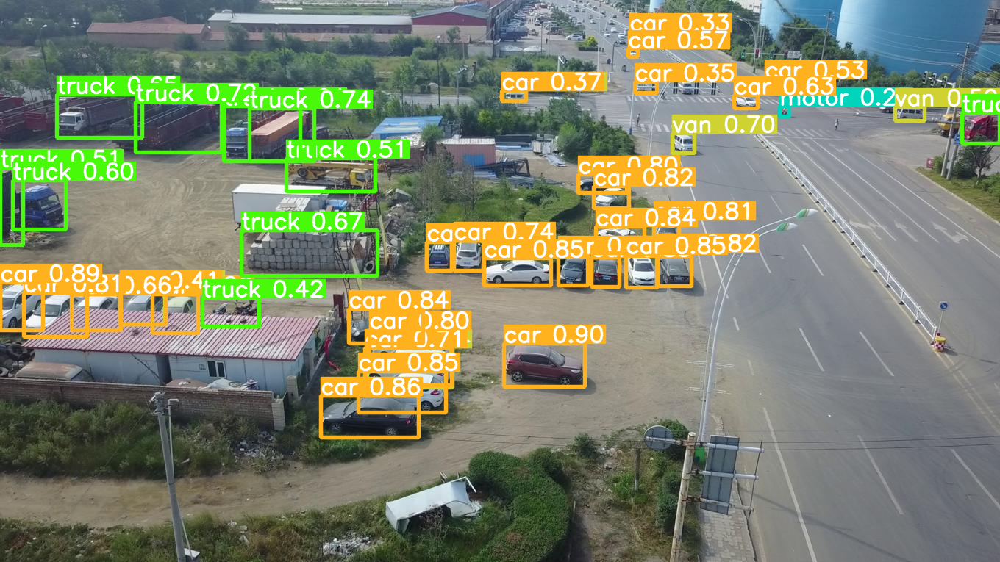

In [ ]:
results = model.predict("test.jpg")

cv2_imshow(results[0].plot())



0: 384x640 28 cars, 6 vans, 10 trucks, 1 motor, 20.1ms
Speed: 1.5ms preprocess, 20.1ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)


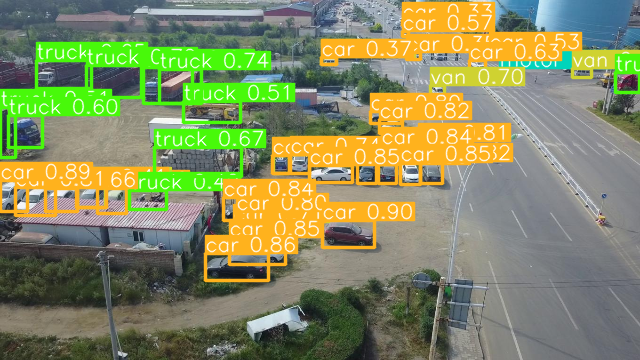

In [12]:
image = cv2.imread("test.jpg")
imag_resize = cv2.resize(image, (640,360),
               interpolation = cv2.INTER_LINEAR)
results = model.predict(imag_resize)

cv2_imshow(results[0].plot())



image 1/1 /content/drive/.shortcut-targets-by-id/1tiBC4N1D1C498rbABPQykfd5C6v__ORb/Colab Notebooks/Yolov8s VisDrone/test_1.jpg: 416x640 26 pedestrians, 12 peoples, 9 cars, 2 vans, 9 motors, 60.2ms
Speed: 3.3ms preprocess, 60.2ms inference, 41.0ms postprocess per image at shape (1, 3, 416, 640)


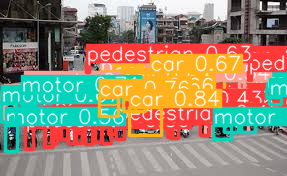

In [5]:
results = model.predict("test_1.jpg")

cv2_imshow(results[0].plot())


0: 384x640 8 pedestrians, 8 peoples, 14 cars, 10 motors, 11.2ms
Speed: 2.3ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


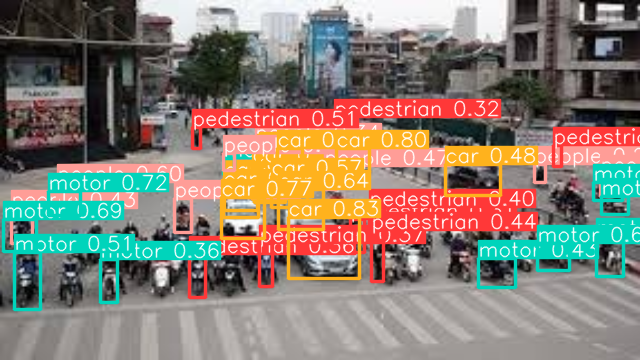

In [11]:
image = cv2.imread("test_1.jpg")
imag_resize = cv2.resize(image, (640,360),
               interpolation = cv2.INTER_LINEAR)
results = model.predict(imag_resize)

cv2_imshow(results[0].plot())


image 1/1 /content/drive/.shortcut-targets-by-id/1tiBC4N1D1C498rbABPQykfd5C6v__ORb/Colab Notebooks/Yolov8s VisDrone/test_2.jpg: 448x640 18 pedestrians, 7 peoples, 12 cars, 1 van, 1 truck, 1 motor, 64.7ms
Speed: 2.5ms preprocess, 64.7ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)


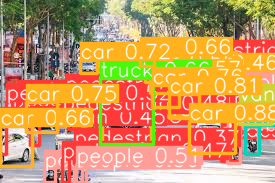

In [7]:
results = model.predict("test_2.jpg")

cv2_imshow(results[0].plot())


0: 384x640 9 pedestrians, 1 people, 9 cars, 1 truck, 1 motor, 70.9ms
Speed: 2.3ms preprocess, 70.9ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)


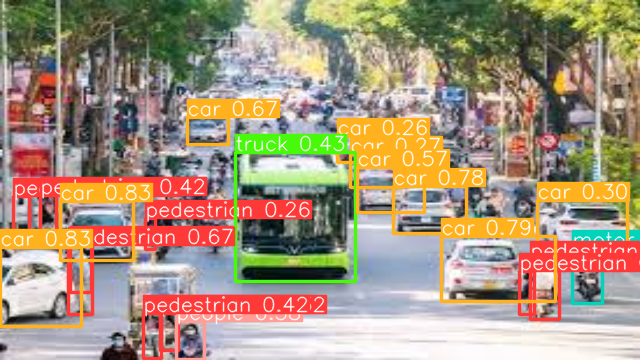

In [10]:
image = cv2.imread("test_2.jpg")
imag_resize = cv2.resize(image, (640,360),
               interpolation = cv2.INTER_LINEAR)
results = model.predict(imag_resize)

cv2_imshow(results[0].plot())

## Log

In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir runs/detect/train

Reusing TensorBoard on port 6006 (pid 55724), started 0:05:29 ago. (Use '!kill 55724' to kill it.)

<IPython.core.display.Javascript object>